In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ayYO6zFFYjcmD5tPahgM")
project = rf.workspace("ppe-ysy71").project("apd-b2ewz")
version = project.version(8)
dataset = version.download("voc")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 34.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 58.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 79.9 MB/s eta 0:00:00:00:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 3.6.0 requires fsspec[http]<=2025.3.0,>=2


Extracting Dataset Version Zip to APD-8 in voc:: 100%|██████████| 5715/5715 [00:00<00:00, 8060.49it/s]


In [2]:
!pip install torchinfo
!pip install albumentations==1.1.0
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 7.3 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 2.0.5
    Uninstalling albumentations-2.0.5:
      Successfully uninstalled albumentations-2.0.5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00:00:01m0:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 4.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.0 MB/s eta 0:00:000:00:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-

In [3]:
import numpy as np
import torch

OUT_DIR = "Results"
TRAIN_DIR_IMAGES= 'APD-8/train'
TRAIN_DIR_LABELS= 'APD-8/train'
VALID_DIR_IMAGES= 'APD-8/valid'
VALID_DIR_LABELS= 'APD-8/valid'
TEST_DIR= 'APD-8/test'
CLASSES = [
    '__background__',
    'Face Mask', 'Glasses', 'Gloves',
    'Hemet', 'Safety Vest', 'Shoes'
]
COLORS = np.random.uniform(0, 1, size=(len(CLASSES), 3))
IMAGE_SIZE = 416
BATCH_SIZE = 32
NUM_WORKERS = 2
NUM_EPOCHS = 100
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
SAVE_VALID_PREDICTIONS = True

In [4]:
import os
import glob
import random
import logging
from pathlib import Path
from xml.etree import ElementTree as et
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yaml
import torch
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision import transforms
from tqdm import tqdm

logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)

def set_log(log_dir):
    logging.basicConfig(
        # level=logging.DEBUG,
        format='%(message)s',
        # datefmt='%a, %d %b %Y %H:%M:%S',
        filename=f"{log_dir}/train.log",
        filemode='w'
    )
    console = logging.StreamHandler()
    console.setLevel(logging.INFO)
    logging.getLogger().addHandler(console)

def log(content, *args):
    for arg in args:
        content += str(arg)
    logger.info(content)

def coco_log(log_dir, stats):
    log_dict_keys = [
        'Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ]',
        'Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ]',
        'Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ]',
    ]
    keys = [
        'mAP@[IoU=0.50-0.95]',
        'mAP@[IoU=0.50     ]',
        'mAP@[IoU=0.75     ]',
    ]
    log_dict = {}

    with open(f"{log_dir}/train.log", 'a+') as f:
        f.writelines('\n')
        for i, key in enumerate(log_dict_keys):
            out_str = f"{keys[i]} = {stats[i]}"
            logger.debug(out_str)
        logger.debug('\n'*2) 

def create_log_csv(log_dir):
    cols = [
        'epoch', 
        'map', 
        'map_05',
        'train loss',
        'train cls loss',
        'train box reg loss',
        'train obj loss',
        'train rpn loss'
    ]
    results_csv = pd.DataFrame(columns=cols)
    results_csv.to_csv(os.path.join(log_dir, 'results.csv'), index=False)

def csv_log(
    log_dir, 
    stats, 
    epoch,
    train_loss_list,
    loss_cls_list,
    loss_box_reg_list,
    loss_objectness_list,
    loss_rpn_list
):
    if epoch+1 == 1:
        create_log_csv(log_dir) 
    
    df = pd.DataFrame(
        {
            'epoch': int(epoch+1),
            'map_05': [float(stats[0])],
            'map': [float(stats[1])],
            'train loss': train_loss_list[-1],
            'train cls loss': loss_cls_list[-1],
            'train box reg loss': loss_box_reg_list[-1],
            'train obj loss': loss_objectness_list[-1],
            'train rpn loss': loss_rpn_list[-1]
        }
    )
    df.to_csv(
        os.path.join(log_dir, 'results.csv'), 
        mode='a', 
        index=False, 
        header=False
    )

plt.style.use('ggplot')

def init_seeds(seed=0, deterministic=False):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  
    
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0
        
    def send(self, value):
        self.current_total += value
        self.iterations += 1
    
    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations
    
    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map
        
    def __call__(
        self, 
        model, 
        current_valid_map, 
        epoch, 
        OUT_DIR,
        model_name
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP 05-095: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'model_name': model_name
                }, f"{OUT_DIR}/best_model.pth")

def show_tranformed_image(train_loader, device, classes, colors):
    if len(train_loader) > 0:
        for i in range(2):
            images, targets = next(iter(train_loader))
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            # Get all the predicited class names.
            pred_classes = [classes[i] for i in targets[i]['labels'].cpu().numpy()]
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)

            lw = max(round(sum(sample.shape) / 2 * 0.003), 2)  # Line width.
            tf = max(lw - 1, 1) # Font thickness.

            for box_num, box in enumerate(boxes):
                p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
                class_name = pred_classes[box_num]
                color = colors[classes.index(class_name)]
                cv2.rectangle(
                    sample,
                    p1,
                    p2,
                    color, 
                    2,
                    cv2.LINE_AA
                )
                w, h = cv2.getTextSize(
                    class_name, 
                    0, 
                    fontScale=lw / 3, 
                    thickness=tf
                )[0]  # text width, height
                outside = p1[1] - h >= 3
                p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
                cv2.putText(
                    sample, 
                    class_name,
                    (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    0.8, 
                    color, 
                    2, 
                    cv2.LINE_AA
                )
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_loss_plot(
    OUT_DIR, 
    train_loss_list, 
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss_iter'
):
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")

def save_mAP(OUT_DIR, map_05, map):
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-', 
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-', 
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

def visualize_mosaic_images(boxes, labels, image_resized, classes):
    print(boxes)
    print(labels)
    image_resized = cv2.cvtColor(image_resized, cv2.COLOR_RGB2BGR)
    for j, box in enumerate(boxes):
        color = (0, 255, 0)
        classn = labels[j]
        cv2.rectangle(image_resized,
                    (int(box[0]), int(box[1])),
                    (int(box[2]), int(box[3])),
                    color, 2)
        cv2.putText(image_resized, classes[classn], 
                    (int(box[0]), int(box[1]-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 
                    2, lineType=cv2.LINE_AA)
    cv2.imshow('Mosaic', image_resized)
    cv2.waitKey(0)

def save_model(
    epoch, 
    model, 
    optimizer, 
    train_loss_list,
    train_loss_list_epoch, 
    val_map,
    val_map_05,
    OUT_DIR,
    model_name
):
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'train_loss_list': train_loss_list,
                'train_loss_list_epoch': train_loss_list_epoch,
                'val_map': val_map,
                'val_map_05': val_map_05,
                'model_name': model_name
                }, f"{OUT_DIR}/last_model.pth")

def save_model_state(model, OUT_DIR, model_name):
    torch.save({
                'model_state_dict': model.state_dict(),
                'model_name': model_name
                }, f"{OUT_DIR}/last_model_state.pth")

def denormalize(x, mean=None, std=None):
    # Shape of x here should be [B, 3, H, W].
    for t, m, s in zip(x, mean, std):
        t.mul_(s).add_(m)
    # Returns tensor of shape [B, 3, H, W].
    return torch.clamp(t, 0, 1)

def save_validation_results(images, detections, counter, out_dir, classes, colors):
    IMG_MEAN = [0.485, 0.456, 0.406]
    IMG_STD = [0.229, 0.224, 0.225]
    image_list = []
    
    for i, detection in enumerate(detections):
        image_c = images[i].clone()
        image_c = image_c.detach().cpu().numpy().astype(np.float32)
        image = np.transpose(image_c, (1, 2, 0))
        image = np.ascontiguousarray(image, dtype=np.float32)
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

        scores = detection['scores'].cpu().numpy()
        labels = detection['labels']
        bboxes = detection['boxes'].detach().cpu().numpy()
        boxes = bboxes[scores >= 0.5].astype(np.int32)
        pred_classes = [classes[i] for i in labels.cpu().numpy()]

        for j, box in enumerate(boxes):
            class_name = pred_classes[j]
            color = colors[classes.index(class_name)]
            try:
                color2 = colors[classes.index(class_name)+1]
            except:
                color2 = colors[classes.index(class_name)-1]

            box_height = max(box[3] - box[1], 1)
            font_scale = max(0.4, min(box_height / 250.0, 0.6))
            thickness = max(1, min(int(box_height / 90), 2))
            text = str(class_name)
            (text_width, text_height), baseline = cv2.getTextSize(
                text, cv2.FONT_HERSHEY_DUPLEX, font_scale, thickness
            )
            text_x, text_y = box[0], max(box[1], text_height)

            cv2.rectangle(image,
                          (int(box[0]), int(box[1])),
                          (int(box[2]), int(box[3])),
                          color, 2, lineType=cv2.LINE_AA)
            
            cv2.rectangle(image, (text_x, text_y - text_height - 5), 
                          (text_x + text_width, text_y + baseline - 5), 
                          color, -1)

            cv2.putText(image, text, (text_x, text_y), cv2.FONT_HERSHEY_DUPLEX, 
                        font_scale, color2, thickness)

        cv2.imwrite(f"{out_dir}/image_{i}_{counter}.jpg", image * 255.0)
        image_list.append(image[:, :, ::-1]) 
    return image_list

def set_infer_dir():
    if not os.path.exists('outputs/inference'):
        os.makedirs('outputs/inference')
    num_infer_dirs_present = len(os.listdir('outputs/inference/'))
    next_dir_num = num_infer_dirs_present + 1
    new_dir_name = f"outputs/inference/res_{next_dir_num}"
    os.makedirs(new_dir_name, exist_ok=True)
    return new_dir_name

def set_training_dir(dir_name=None, project_dir=None):
    if project_dir != None:
        os.makedirs(project_dir, exist_ok=True)
        return project_dir
    if not os.path.exists('outputs/training'):
        os.makedirs('outputs/training')
    if dir_name:
        new_dir_name = f"outputs/training/{dir_name}"
        os.makedirs(new_dir_name, exist_ok=True)
        return new_dir_name
    else:
        num_train_dirs_present = len(os.listdir('outputs/training/'))
        next_dir_num = num_train_dirs_present + 1
        new_dir_name = f"outputs/training/res_{next_dir_num}"
        os.makedirs(new_dir_name, exist_ok=True)
        return new_dir_name

def yaml_save(file_path=None, data={}):
    with open(file_path, 'w') as f:
        yaml.safe_dump(
            {k: str(v) if isinstance(v, Path) else v for k, v in data.items()}, 
            f, 
            sort_keys=False
        )

class EarlyStopping():
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_map = None
        self.early_stop = False

    def __call__(self, map):
        if self.best_map == None:
            self.best_map = map
        elif map - self.best_map > self.min_delta:
            self.best_map = map
            # reset counter if validation loss improves
            self.counter = 0
        elif map - self.best_map < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

def resize(im, img_size=640, square=False):
    # Aspect ratio resize
    if square:
        im = cv2.resize(im, (img_size, img_size))
    else:
        h0, w0 = im.shape[:2]  # orig hw
        r = img_size / max(h0, w0)  # ratio
        if r != 1:  # if sizes are not equal
            im = cv2.resize(im, (int(w0 * r), int(h0 * r)))
    return im

def get_train_aug():
    return A.Compose([
        # A.OneOf([
        #     A.Blur(blur_limit=3, p=0.5),
        #     A.MotionBlur(blur_limit=3, p=0.5),
        #     A.MedianBlur(blur_limit=3, p=0.5),
        # ], p=0.5),
        # A.RandomBrightnessContrast(p=0.1),
        # A.ColorJitter(p=0.1),
        # A.RandomGamma(p=0.1),
        ToTensorV2(p=1.0),
    ], bbox_params=A.BboxParams(
        format='pascal_voc',
        label_fields=['labels'],
    ))

def get_train_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params=A.BboxParams(
        format='pascal_voc',
        label_fields=['labels'],
    ))

def transform_mosaic(mosaic, boxes, img_size=640):
    aug = A.Compose(
        [A.Resize(img_size, img_size, always_apply=True, p=1.0)
    ])
    sample = aug(image=mosaic)
    resized_mosaic = sample['image']
    transformed_boxes = (np.array(boxes) / mosaic.shape[0]) * resized_mosaic.shape[1]
    for box in transformed_boxes:
        if box[2] - box[0] <= 1.0:
            box[2] = box[2] + (1.0 - (box[2] - box[0]))
            if box[2] >= float(resized_mosaic.shape[1]):
                box[2] = float(resized_mosaic.shape[1])
        if box[3] - box[1] <= 1.0:
            box[3] = box[3] + (1.0 - (box[3] - box[1]))
            if box[3] >= float(resized_mosaic.shape[0]):
                box[3] = float(resized_mosaic.shape[0])
    return resized_mosaic, transformed_boxes

def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params=A.BboxParams(
        format='pascal_voc',
        label_fields=['labels'],
    ))

def infer_transforms(image):
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.ToTensor(),
    ])
    return transform(image)


class CustomDataset(Dataset):
    def __init__(
        self, 
        images_path, 
        labels_path, 
        img_size, 
        classes, 
        transforms=None, 
        use_train_aug=False,
        train=False, 
        mosaic=1.0,
        square_training=False
    ):
        self.transforms = transforms
        self.use_train_aug = use_train_aug
        self.images_path = images_path
        self.labels_path = labels_path
        self.img_size = img_size
        self.classes = classes
        self.train = train
        self.square_training = square_training
        self.mosaic_border = [-img_size // 2, -img_size // 2]
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []
        self.log_annot_issue_x = True
        self.mosaic = mosaic
        self.log_annot_issue_y = True
        
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.images_path, file_type)))
        self.all_annot_paths = glob.glob(os.path.join(self.labels_path, '*.xml'))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)
        self.read_and_clean()

    def read_and_clean(self):
        print('Checking Labels and images...')
        images_to_remove = []
        problematic_images = []

        for image_name in tqdm(self.all_images, total=len(self.all_images)):
            possible_xml_name = os.path.join(self.labels_path, os.path.splitext(image_name)[0]+'.xml')
            if possible_xml_name not in self.all_annot_paths:
                print(f"⚠️ {possible_xml_name} not found... Removing {image_name}")
                images_to_remove.append(image_name)
                continue

            tree = et.parse(possible_xml_name)
            root = tree.getroot()
            invalid_bbox = False

            for member in root.findall('object'):
                xmin = float(member.find('bndbox').find('xmin').text)
                xmax = float(member.find('bndbox').find('xmax').text)
                ymin = float(member.find('bndbox').find('ymin').text)
                ymax = float(member.find('bndbox').find('ymax').text)

                if xmin >= xmax or ymin >= ymax:
                    invalid_bbox = True
                    break

            if invalid_bbox:
                problematic_images.append(image_name)
                images_to_remove.append(image_name)

        self.all_images = [img for img in self.all_images if img not in images_to_remove]
        self.all_annot_paths = [
            path for path in self.all_annot_paths 
            if not any(os.path.splitext(os.path.basename(path))[0] + ext in images_to_remove 
                       for ext in self.image_file_types)
        ]

        if problematic_images:
            print("\n⚠️ The following images have invalid bounding boxes and will be removed:")
            for img in problematic_images:
                print(f"⚠️ {img}")

        print(f"Removed {len(images_to_remove)} problematic images and annotations.")

    def resize(self, im, square=False):
        if square:
            im = cv2.resize(im, (self.img_size, self.img_size))
        else:
            h0, w0 = im.shape[:2]  # orig hw
            r = self.img_size / max(h0, w0)  # ratio
            if r != 1:  # if sizes are not equal
                im = cv2.resize(im, (int(w0 * r), int(h0 * r)))
        return im

    def load_image_and_labels(self, index):
        image_name = self.all_images[index]
        image_path = os.path.join(self.images_path, image_name)

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = self.resize(image, square=self.square_training)
        image_resized /= 255.0
        
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.labels_path, annot_filename)

        boxes = []
        orig_boxes = []
        labels = []
        
        image_width = image.shape[1]
        image_height = image.shape[0]

        tree = et.parse(annot_file_path)
        root = tree.getroot()
        for member in root.findall('object'):
            labels.append(self.classes.index(member.find('name').text))
            
            # xmin = left corner x-coordinates
            xmin = float(member.find('bndbox').find('xmin').text)
            # xmax = right corner x-coordinates
            xmax = float(member.find('bndbox').find('xmax').text)
            # ymin = left corner y-coordinates
            ymin = float(member.find('bndbox').find('ymin').text)
            # ymax = right corner y-coordinates
            ymax = float(member.find('bndbox').find('ymax').text)

            xmin, ymin, xmax, ymax = self.check_image_and_annotation(
                xmin, 
                ymin, 
                xmax, 
                ymax, 
                image_width, 
                image_height, 
                orig_data=True
            )

            orig_boxes.append([xmin, ymin, xmax, ymax])
            xmin_final = (xmin/image_width)*image_resized.shape[1]
            xmax_final = (xmax/image_width)*image_resized.shape[1]
            ymin_final = (ymin/image_height)*image_resized.shape[0]
            ymax_final = (ymax/image_height)*image_resized.shape[0]

            xmin_final, ymin_final, xmax_final, ymax_final = self.check_image_and_annotation(
                xmin_final, 
                ymin_final, 
                xmax_final, 
                ymax_final, 
                image_resized.shape[1], 
                image_resized.shape[0],
                orig_data=False
            )
            
            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])
        boxes_length = len(boxes)
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if boxes_length > 0 else torch.as_tensor(boxes, dtype=torch.float32)
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64) if boxes_length > 0 else torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        return image, image_resized, orig_boxes, \
            boxes, labels, area, iscrowd, (image_width, image_height)

    def check_image_and_annotation(
        self, 
        xmin, 
        ymin, 
        xmax, 
        ymax, 
        width, 
        height, 
        orig_data=False
    ):
        if ymax > height:
            ymax = height
        if xmax > width:
            xmax = width
        if xmax - xmin <= 1.0:
            if orig_data:
                self.log_annot_issue_x = False
            xmin = xmin - 1
        if ymax - ymin <= 1.0:
            if orig_data:
                self.log_annot_issue_y = False
            ymin = ymin - 1
        return xmin, ymin, xmax, ymax


    def load_cutmix_image_and_boxes(self, index, resize_factor=512):
        """ 
        Adapted from: https://www.kaggle.com/shonenkov/oof-evaluation-mixup-efficientdet
        """
        s = self.img_size
        yc, xc = (int(random.uniform(-x, 2 * s + x)) for x in self.mosaic_border)  # mosaic center x, y
        indices = [index] + [random.randint(0, len(self.all_images) - 1) for _ in range(3)]

        result_boxes = []
        result_classes = []

        for i, index in enumerate(indices):
            _, image_resized, orig_boxes, boxes, \
            labels, area, iscrowd, dims = self.load_image_and_labels(
                index=index
            )

            h, w = image_resized.shape[:2]

            if i == 0:
                # Create empty image with the above resized image.
                result_image = np.full((s * 2, s * 2, image_resized.shape[2]), 114/255, dtype=np.float32)  # base image with 4 tiles
                x1a, y1a, x2a, y2a = max(xc - w, 0), max(yc - h, 0), xc, yc  # xmin, ymin, xmax, ymax (large image)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), h - (y2a - y1a), w, h  # xmin, ymin, xmax, ymax (small image)
            elif i == 1:  # top right
                x1a, y1a, x2a, y2a = xc, max(yc - h, 0), min(xc + w, s * 2), yc
                x1b, y1b, x2b, y2b = 0, h - (y2a - y1a), min(w, x2a - x1a), h
            elif i == 2:  # bottom left
                x1a, y1a, x2a, y2a = max(xc - w, 0), yc, xc, min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), 0, max(xc, w), min(y2a - y1a, h)
            elif i == 3:  # bottom right
                x1a, y1a, x2a, y2a = xc, yc, min(xc + w, s * 2), min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = 0, 0, min(w, x2a - x1a), min(y2a - y1a, h)
            result_image[y1a:y2a, x1a:x2a] = image_resized[y1b:y2b, x1b:x2b]
            padw = x1a - x1b
            padh = y1a - y1b

            if len(orig_boxes) > 0:
                boxes[:, 0] += padw
                boxes[:, 1] += padh
                boxes[:, 2] += padw
                boxes[:, 3] += padh

                result_boxes.append(boxes)
                result_classes += labels

        final_classes = []
        if len(result_boxes) > 0:
            result_boxes = np.concatenate(result_boxes, 0)
            np.clip(result_boxes[:, 0:], 0, 2 * s, out=result_boxes[:, 0:])
            result_boxes = result_boxes.astype(np.int32)
            for idx in range(len(result_boxes)):
                if ((result_boxes[idx, 2] - result_boxes[idx, 0]) * (result_boxes[idx, 3] - result_boxes[idx, 1])) > 0:
                    final_classes.append(result_classes[idx])
            result_boxes = result_boxes[
                np.where((result_boxes[:, 2] - result_boxes[:, 0]) * (result_boxes[:, 3] - result_boxes[:, 1]) > 0)
            ]
        # Resize the mosaic image to the desired shape and transform boxes.
        result_image, result_boxes = transform_mosaic(
            result_image, result_boxes, self.img_size
        )
        return result_image, torch.tensor(result_boxes), \
            torch.tensor(np.array(final_classes)), area, iscrowd, dims

    def __getitem__(self, idx):
        if not self.train: # No mosaic during validation.
            image, image_resized, orig_boxes, boxes, \
                labels, area, iscrowd, dims = self.load_image_and_labels(
                index=idx
            )
        
        if self.train: 
            mosaic_prob = random.uniform(0.0, 1.0)
            if self.mosaic >= mosaic_prob:
                image_resized, boxes, labels, \
                    area, iscrowd, dims = self.load_cutmix_image_and_boxes(
                    idx, resize_factor=(self.img_size, self.img_size)
                )
            else:
                image, image_resized, orig_boxes, boxes, \
                    labels, area, iscrowd, dims = self.load_image_and_labels(
                    index=idx
                )
        

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        if self.use_train_aug: # Use train augmentation if argument is passed.
            train_aug = get_train_aug()
            sample = train_aug(image=image_resized,
                                     bboxes=target['boxes'],
                                     labels=labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes']).to(torch.int64)
        else:
            sample = self.transforms(image=image_resized,
                                     bboxes=target['boxes'],
                                     labels=[int(l) for l in labels])
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes']).to(torch.int64)

        # Fix to enable training without target bounding boxes,
        # see https://discuss.pytorch.org/t/fasterrcnn-images-with-no-objects-present-cause-an-error/117974/4
        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)

def collate_fn(batch):
    return tuple(zip(*batch))

def create_train_dataset(
    train_dir_images, 
    train_dir_labels, 
    img_size, 
    classes,
    use_train_aug=False,
    mosaic=1.0,
    square_training=False
):
    train_dataset = CustomDataset(
        train_dir_images, 
        train_dir_labels,
        img_size, 
        classes, 
        get_train_transform(),
        use_train_aug=use_train_aug,
        train=True, 
        mosaic=mosaic,
        square_training=square_training
    )
    return train_dataset
def create_valid_dataset(
    valid_dir_images, 
    valid_dir_labels, 
    img_size, 
    classes,
    square_training=False
):
    valid_dataset = CustomDataset(
        valid_dir_images, 
        valid_dir_labels, 
        img_size, 
        classes, 
        get_valid_transform(),
        train=False, 
        square_training=square_training
    )
    return valid_dataset

def create_train_loader(
    train_dataset, batch_size, num_workers=0, batch_sampler=None
):
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        # shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        sampler=batch_sampler
    )
    return train_loader

def create_valid_loader(
    valid_dataset, batch_size, num_workers=0, batch_sampler=None
):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        sampler=batch_sampler
    )
    return valid_loader

In [5]:
import torch
import torch.nn as nn
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchinfo import summary

def create_model(num_classes, weight="imagenet"):
    try:
        global model
        del model
        torch.cuda.empty_cache()
    except:
        pass

    if weight=="imagenet":
        backbone = torchvision.models.efficientnet_v2_s(weights='DEFAULT')
    else:
        backbone = torchvision.models.efficientnet_v2_s(weights=None)
        
    features = list(backbone.features)
    features[2] = nn.Sequential(*list(features[2].children())[:-2])  
    features[3] = nn.Sequential(*list(features[3].children())[:-2])  
    features[4] = nn.Sequential(*list(features[4].children())[:-3])      
    features[5] = nn.Sequential(*list(features[5].children())[:-5])    
    features[6] = nn.Sequential(*list(features[6].children())[:-10]) 
    features[7] = torchvision.ops.misc.Conv2dNormActivation(
        in_channels=256,
        out_channels=512,
        kernel_size=1,
        norm_layer=nn.BatchNorm2d,
        activation_layer=nn.SiLU
    )
    backbone = nn.Sequential(*features)
    backbone.out_channels = 512
    anchor_generator = AnchorGenerator(
        sizes=((32, 64, 128, 224),),
        aspect_ratios=((0.5, 1.0, 2.0),)
    )

    roi_pooler = torchvision.ops.MultiScaleRoIAlign(
        featmap_names=['0'],
        output_size=5,
        sampling_ratio=2
    )

    model = FasterRCNN(
        backbone=backbone,
        num_classes=num_classes,
        rpn_anchor_generator=anchor_generator,
        box_roi_pool=roi_pooler
    )

    return model

In [6]:
import os
import sys
import io
import math
import time
import copy
import errno
import datetime
from contextlib import redirect_stdout
from collections import defaultdict, deque
import numpy as np
import torch
import torch.distributed as dist
import torchvision.models.detection.mask_rcnn
from pycocotools import mask as coco_mask
import pycocotools.mask as mask_util
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

class SmoothedValue:
    def __init__(self, window_size=20, fmt=None):
        if fmt is None:
            fmt = "{median:.4f} ({global_avg:.4f})"
        self.deque = deque(maxlen=window_size)
        self.total = 0.0
        self.count = 0
        self.fmt = fmt

    def update(self, value, n=1):
        self.deque.append(value)
        self.count += n
        self.total += value * n

    def synchronize_between_processes(self):
        """
        Warning: does not synchronize the deque!
        """
        if not is_dist_avail_and_initialized():
            return
        t = torch.tensor([self.count, self.total], dtype=torch.float64, device="cuda")
        dist.barrier()
        dist.all_reduce(t)
        t = t.tolist()
        self.count = int(t[0])
        self.total = t[1]

    @property
    def median(self):
        d = torch.tensor(list(self.deque))
        return d.median().item()

    @property
    def avg(self):
        d = torch.tensor(list(self.deque), dtype=torch.float32)
        return d.mean().item()

    @property
    def global_avg(self):
        return self.total / self.count

    @property
    def max(self):
        return max(self.deque)

    @property
    def value(self):
        return self.deque[-1]

    def __str__(self):
        return self.fmt.format(
            median=self.median, avg=self.avg, global_avg=self.global_avg, max=self.max, value=self.value
        )


class CocoEvaluator:
    def __init__(self, coco_gt, iou_types):
        assert isinstance(iou_types, (list, tuple))
        coco_gt = copy.deepcopy(coco_gt)
        self.coco_gt = coco_gt

        self.iou_types = iou_types
        self.coco_eval = {}
        for iou_type in iou_types:
            self.coco_eval[iou_type] = COCOeval(coco_gt, iouType=iou_type)

        self.img_ids = []
        self.eval_imgs = {k: [] for k in iou_types}

    def update(self, predictions):
        img_ids = list(np.unique(list(predictions.keys())))
        self.img_ids.extend(img_ids)

        for iou_type in self.iou_types:
            results = self.prepare(predictions, iou_type)
            with redirect_stdout(io.StringIO()):
                coco_dt = COCO.loadRes(self.coco_gt, results) if results else COCO()
            coco_eval = self.coco_eval[iou_type]

            coco_eval.cocoDt = coco_dt
            coco_eval.params.imgIds = list(img_ids)
            img_ids, eval_imgs = evaluate(coco_eval)

            self.eval_imgs[iou_type].append(eval_imgs)

    def synchronize_between_processes(self):
        for iou_type in self.iou_types:
            self.eval_imgs[iou_type] = np.concatenate(self.eval_imgs[iou_type], 2)
            create_common_coco_eval(self.coco_eval[iou_type], self.img_ids, self.eval_imgs[iou_type])

    def accumulate(self):
        for coco_eval in self.coco_eval.values():
            coco_eval.accumulate()

    def summarize(self):
        for iou_type, coco_eval in self.coco_eval.items():
            print(f"IoU metric: {iou_type}")
            coco_eval.summarize()
        return coco_eval.stats

    def prepare(self, predictions, iou_type):
        if iou_type == "bbox":
            return self.prepare_for_coco_detection(predictions)
        if iou_type == "segm":
            return self.prepare_for_coco_segmentation(predictions)
        if iou_type == "keypoints":
            return self.prepare_for_coco_keypoint(predictions)
        raise ValueError(f"Unknown iou type {iou_type}")

    def prepare_for_coco_detection(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "bbox": box,
                        "score": scores[k],
                    }
                    for k, box in enumerate(boxes)
                ]
            )
        return coco_results

    def prepare_for_coco_segmentation(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            scores = prediction["scores"]
            labels = prediction["labels"]
            masks = prediction["masks"]

            masks = masks > 0.5

            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            rles = [
                mask_util.encode(np.array(mask[0, :, :, np.newaxis], dtype=np.uint8, order="F"))[0] for mask in masks
            ]
            for rle in rles:
                rle["counts"] = rle["counts"].decode("utf-8")

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "segmentation": rle,
                        "score": scores[k],
                    }
                    for k, rle in enumerate(rles)
                ]
            )
        return coco_results

    def prepare_for_coco_keypoint(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()
            keypoints = prediction["keypoints"]
            keypoints = keypoints.flatten(start_dim=1).tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "keypoints": keypoint,
                        "score": scores[k],
                    }
                    for k, keypoint in enumerate(keypoints)
                ]
            )
        return coco_results

def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def merge(img_ids, eval_imgs):
    all_img_ids = [img_ids]
    all_eval_imgs = [eval_imgs]

    merged_img_ids = []
    for p in all_img_ids:
        merged_img_ids.extend(p)

    merged_eval_imgs = []
    for p in all_eval_imgs:
        merged_eval_imgs.append(p)

    merged_img_ids = np.array(merged_img_ids)
    merged_eval_imgs = np.concatenate(merged_eval_imgs, 2)

    # keep only unique (and in sorted order) images
    merged_img_ids, idx = np.unique(merged_img_ids, return_index=True)
    merged_eval_imgs = merged_eval_imgs[..., idx]

    return merged_img_ids, merged_eval_imgs


def create_common_coco_eval(coco_eval, img_ids, eval_imgs):
    img_ids, eval_imgs = merge(img_ids, eval_imgs)
    img_ids = list(img_ids)
    eval_imgs = list(eval_imgs.flatten())

    coco_eval.evalImgs = eval_imgs
    coco_eval.params.imgIds = img_ids
    coco_eval._paramsEval = copy.deepcopy(coco_eval.params)


def evaluate(imgs):
    with redirect_stdout(io.StringIO()):
        imgs.evaluate()
    return imgs.params.imgIds, np.asarray(imgs.evalImgs).reshape(-1, len(imgs.params.areaRng), len(imgs.params.imgIds))

def convert_to_coco_api(ds):
    coco_ds = COCO()
    ann_id = 1
    dataset = {"images": [], "categories": [], "annotations": []}
    categories = set()
    for img_idx in range(len(ds)):
        img, targets = ds[img_idx]
        image_id = targets["image_id"].item()
        img_dict = {}
        img_dict["id"] = image_id
        img_dict["height"] = img.shape[-2]
        img_dict["width"] = img.shape[-1]
        dataset["images"].append(img_dict)
        bboxes = targets["boxes"]
        if len(bboxes) > 0:
            bboxes[:, 2:] -= bboxes[:, :2]
        bboxes = bboxes.tolist()
        labels = targets["labels"].tolist()
        areas = targets["area"].tolist()
        iscrowd = targets["iscrowd"].tolist()
        if "masks" in targets:
            masks = targets["masks"]
            masks = masks.permute(0, 2, 1).contiguous().permute(0, 2, 1)
        if "keypoints" in targets:
            keypoints = targets["keypoints"]
            keypoints = keypoints.reshape(keypoints.shape[0], -1).tolist()
        num_objs = len(bboxes)
        for i in range(num_objs):
            ann = {}
            ann["image_id"] = image_id
            ann["bbox"] = bboxes[i]
            ann["category_id"] = labels[i]
            categories.add(labels[i])
            ann["area"] = areas[i]
            ann["iscrowd"] = iscrowd[i]
            ann["id"] = ann_id
            if "masks" in targets:
                ann["segmentation"] = coco_mask.encode(masks[i].numpy())
            if "keypoints" in targets:
                ann["keypoints"] = keypoints[i]
                ann["num_keypoints"] = sum(k != 0 for k in keypoints[i][2::3])
            dataset["annotations"].append(ann)
            ann_id += 1
    dataset["categories"] = [{"id": i} for i in sorted(categories)]
    coco_ds.dataset = dataset
    coco_ds.createIndex()
    return coco_ds

def get_coco_api_from_dataset(dataset):
    for _ in range(10):
        if isinstance(dataset, torchvision.datasets.CocoDetection):
            break
        if isinstance(dataset, torch.utils.data.Subset):
            dataset = dataset.dataset
    if isinstance(dataset, torchvision.datasets.CocoDetection):
        return dataset.coco
    return convert_to_coco_api(dataset)

def train_one_epoch(
    model, 
    optimizer, 
    data_loader, 
    device, 
    epoch,
    NUM_EPOCHS,
    train_loss_hist,
    print_freq, 
    scaler=None,
    scheduler=None
):
    model.train()

    batch_loss_list = []
    batch_loss_cls_list = []
    batch_loss_box_reg_list = []
    batch_loss_objectness_list = []
    batch_loss_rpn_list = []

    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1.0 / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = torch.optim.lr_scheduler.LinearLR(
            optimizer, start_factor=warmup_factor, total_iters=warmup_iters
        )

    step_counter = 0

    progress_bar = tqdm(data_loader, desc=f"Epoch [{epoch+1}/{NUM_EPOCHS}]", total=len(data_loader))
    for images, targets in progress_bar:
        step_counter += 1

        images = [image.to(device) for image in images]
        targets = [{k: v.to(device).to(torch.int64) for k, v in t.items()} for t in targets]

        with torch.amp.autocast(device_type=device.type, enabled=scaler is not None):
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

        loss_dict_reduced = loss_dict
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())
        loss_value = losses_reduced.item()

        if not math.isfinite(loss_value):
            print(f"Loss is {loss_value}, stopping training")
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        if scaler is not None:
            scaler.scale(losses).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            losses.backward()
            optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        if scheduler is not None:
            scheduler.step(epoch + (step_counter / len(data_loader)))

        batch_loss_list.append(loss_value)
        batch_loss_cls_list.append(loss_dict_reduced['loss_classifier'].detach().cpu())
        batch_loss_box_reg_list.append(loss_dict_reduced['loss_box_reg'].detach().cpu())
        batch_loss_objectness_list.append(loss_dict_reduced['loss_objectness'].detach().cpu())
        batch_loss_rpn_list.append(loss_dict_reduced['loss_rpn_box_reg'].detach().cpu())
        train_loss_hist.send(loss_value)

        progress_bar.set_postfix({
            # "Loss": f"{loss_value:.4f}",
            "cls_loss": f"{loss_dict_reduced['loss_classifier']:.4f}",
            "box_loss": f"{loss_dict_reduced['loss_box_reg']:.4f}",
            "obj_loss": f"{loss_dict_reduced['loss_objectness']:.4f}",
            "rpn_loss": f"{loss_dict_reduced['loss_rpn_box_reg']:.4f}",
        })

    return (
        None,
        batch_loss_list, 
        batch_loss_cls_list, 
        batch_loss_box_reg_list, 
        batch_loss_objectness_list, 
        batch_loss_rpn_list
    )

@torch.inference_mode()
def evaluate_train(
    model, 
    data_loader, 
    device, 
    save_valid_preds=False,
    out_dir=None,
    classes=None,
    colors=None
):
    n_threads = torch.get_num_threads()
    torch.set_num_threads(1)
    cpu_device = torch.device("cpu")
    model.eval()

    coco = get_coco_api_from_dataset(data_loader.dataset)
    iou_types = ["bbox"]
    coco_evaluator = CocoEvaluator(coco, iou_types)

    val_saved_image = None  # Init just in case

    progress_bar = tqdm(data_loader, desc="Evaluating", total=len(data_loader))
    for counter, (images, targets) in enumerate(progress_bar, start=1):
        images = [img.to(device) for img in images]

        if torch.cuda.is_available():
            torch.cuda.synchronize()

        model_start_time = time.time()
        outputs = model(images)
        model_time = time.time() - model_start_time

        outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
        res = {target["image_id"].item(): output for target, output in zip(targets, outputs)}

        eval_start_time = time.time()
        coco_evaluator.update(res)
        evaluator_time = time.time() - eval_start_time

        progress_bar.set_postfix({
            "Model Time": f"{model_time:.3f}s",
            "Eval Time": f"{evaluator_time:.3f}s"
        })

        if save_valid_preds and counter == 1:
            val_saved_image = save_validation_results(
                images, outputs, counter, out_dir, classes, colors
            )
        elif not save_valid_preds and counter == 1:
            val_saved_image = np.ones((1, 64, 64, 3))  # dummy image

    coco_evaluator.synchronize_between_processes()
    coco_evaluator.accumulate()
    stats = coco_evaluator.summarize()

    torch.set_num_threads(n_threads)
    return stats, val_saved_image

In [7]:
import re
from torch.utils.data import RandomSampler, SequentialSampler
import torch.nn as nn
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from pprint import pprint
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from torchvision.ops import box_iou

def trainer(model, optimizer="adam", lr=0.001, OUT_DIR=OUT_DIR, NUM_EPOCHS=NUM_EPOCHS):
    parent_dir = "."  
    existing_dirs = [d for d in os.listdir(parent_dir)
                     if os.path.isdir(os.path.join(parent_dir, d)) and d.startswith(OUT_DIR)]
    
    max_suffix = 0
    pattern = re.compile(rf"^{re.escape(OUT_DIR)}(\d*)$")
    
    for d in existing_dirs:
        match = pattern.match(d)
        if match:
            suffix = match.group(1)
            if suffix.isdigit():
                max_suffix = max(max_suffix, int(suffix))
            elif suffix == "":
                max_suffix = max(max_suffix, 1)  
    if max_suffix == 0:
        OUT_DIR = OUT_DIR
    else:
        OUT_DIR = f"{OUT_DIR}{max_suffix + 1}"
    global od
    od = OUT_DIR
    os.makedirs(OUT_DIR)
    model.transform.min_size = (IMAGE_SIZE, )
    
    set_log(OUT_DIR)
    train_dataset = create_train_dataset(
        TRAIN_DIR_IMAGES, 
        TRAIN_DIR_LABELS,
        IMAGE_SIZE, 
        CLASSES,
    )
    valid_dataset = create_valid_dataset(
        VALID_DIR_IMAGES, 
        VALID_DIR_LABELS, 
        IMAGE_SIZE, 
        CLASSES,
    )
    train_sampler = RandomSampler(train_dataset)
    valid_sampler = SequentialSampler(valid_dataset)

    train_loader = create_train_loader(
        train_dataset, BATCH_SIZE, NUM_WORKERS, batch_sampler=train_sampler
    )
    valid_loader = create_valid_loader(
        valid_dataset, BATCH_SIZE, NUM_WORKERS, batch_sampler=valid_sampler
    )

    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")
    
    model = model.to(DEVICE)
    print(summary(model, device=DEVICE, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE), col_names=["input_size", "output_size", "num_params"]))
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    if optimizer == "adamw":
        optimizer = torch.optim.AdamW(params, lr=lr, weight_decay=0.0005)
    elif optimizer == "adam":
        optimizer = torch.optim.Adam(params, lr=lr)
    elif optimizer == "sgd":
        optimizer = torch.optim.SGD(params, lr=lr, momentum=0.9, weight_decay=0.0001)
        
    train_loss_hist = Averager()
    train_loss_list = []
    loss_cls_list = []
    loss_box_reg_list = []
    loss_objectness_list = []
    loss_rpn_list = []
    train_loss_list_epoch = []
    val_map_05 = []
    val_map = []
    start_epochs = 0
    
    save_best_model = SaveBestModel()
    early_stopping = EarlyStopping(patience=5)

    for epoch in range(start_epochs, NUM_EPOCHS):
        train_loss_hist.reset()

        _, batch_loss_list, \
            batch_loss_cls_list, \
            batch_loss_box_reg_list, \
            batch_loss_objectness_list, \
            batch_loss_rpn_list = train_one_epoch(
            model, 
            optimizer, 
            train_loader, 
            DEVICE, 
            epoch,
            NUM_EPOCHS,
            train_loss_hist,
            print_freq=100
        )

        stats, val_pred_image = evaluate_train(
            model, 
            valid_loader, 
            device=DEVICE,
            save_valid_preds=SAVE_VALID_PREDICTIONS,
            out_dir=OUT_DIR,
            classes=CLASSES,
            colors=COLORS
        )

        train_loss_list.extend(batch_loss_list)
        loss_cls_list.append(np.mean(np.array(batch_loss_cls_list,)))
        loss_box_reg_list.append(np.mean(np.array(batch_loss_box_reg_list)))
        loss_objectness_list.append(np.mean(np.array(batch_loss_objectness_list)))
        loss_rpn_list.append(np.mean(np.array(batch_loss_rpn_list)))

        train_loss_list_epoch.append(train_loss_hist.value)
        val_map_05.append(stats[1])
        val_map.append(stats[0])

        save_loss_plot(OUT_DIR, train_loss_list)
        save_loss_plot(
            OUT_DIR, 
            train_loss_list_epoch,
            'epochs',
            'train loss',
            save_name='train_loss_epoch' 
        )

        save_loss_plot(
            OUT_DIR, 
            loss_cls_list, 
            'epochs', 
            'loss cls',
            save_name='train_loss_cls'
        )
        save_loss_plot(
            OUT_DIR, 
            loss_box_reg_list, 
            'epochs', 
            'loss bbox reg',
            save_name='train_loss_bbox_reg'
        )
        save_loss_plot(
            OUT_DIR,
            loss_objectness_list,
            'epochs',
            'loss obj',
            save_name='train_loss_obj'
        )
        save_loss_plot(
            OUT_DIR,
            loss_rpn_list,
            'epochs',
            'loss rpn bbox',
            save_name='train_loss_rpn_bbox'
        )

        save_mAP(OUT_DIR, val_map_05, val_map)

        coco_log(OUT_DIR, stats)
        csv_log(
            OUT_DIR, 
            stats, 
            epoch,
            train_loss_list,
            loss_cls_list,
            loss_box_reg_list,
            loss_objectness_list,
            loss_rpn_list
        )

        save_model(
            epoch, 
            model, 
            optimizer, 
            train_loss_list, 
            train_loss_list_epoch,
            val_map,
            val_map_05,
            OUT_DIR,
            "Faster RCNN EfficientNetv2"
        )

        save_model_state(model, OUT_DIR, "Faster RCNN EfficientNetv2")
        save_best_model(
            model, 
            val_map[-1], 
            epoch, 
            OUT_DIR,
            "Faster RCNN EfficientNetv2"
        )

        early_stopping(stats[0])
        if early_stopping.early_stop:
            break

def evaluation(model, PATH_DATA):
    test_dataset = create_valid_dataset(
        PATH_DATA, 
        PATH_DATA, 
        IMAGE_SIZE, 
        CLASSES,
    )
    test_loader = create_valid_loader(
        test_dataset, BATCH_SIZE, NUM_WORKERS
    )

    @torch.inference_mode()
    def evaluate(model, data_loader, device, out_dir=None, classes=None, colors=None):
        metric = MeanAveragePrecision(class_metrics=True)
        n_threads = torch.get_num_threads()
        torch.set_num_threads(1)
        cpu_device = torch.device("cpu")
        model.eval()

        target = []
        preds = []
        true_labels = []
        pred_labels = []

        threshold = 0.5

        progress_bar = tqdm(data_loader, desc="Evaluating", total=len(data_loader))
        for counter, (images, targets) in enumerate(progress_bar, start=1):
            images = [img.to(device) for img in images]

            if torch.cuda.is_available():
                torch.cuda.synchronize()

            model_start_time = time.time()
            with torch.no_grad():
                outputs = model(images)
            model_time = time.time() - model_start_time

            for i in range(len(images)):
                gt_boxes = targets[i]['boxes'].detach().cpu()
                gt_labels = targets[i]['labels'].detach().cpu()

                pred_boxes = outputs[i]['boxes'].detach().cpu()
                pred_scores = outputs[i]['scores'].detach().cpu()
                pred_labels_all = outputs[i]['labels'].detach().cpu()

                keep = pred_scores > threshold
                pred_boxes = pred_boxes[keep]
                pred_labels_kept = pred_labels_all[keep]

                if len(pred_boxes) > 0 and len(gt_boxes) > 0:
                    ious = box_iou(pred_boxes, gt_boxes)
                    matched_gt = set()
                    for pred_idx, iou_row in enumerate(ious):
                        gt_idx = iou_row.argmax()
                        iou_val = iou_row[gt_idx]

                        if iou_val >= 0.25 and gt_idx.item() not in matched_gt:
                            true_labels.append(gt_labels[gt_idx].item())
                            pred_labels.append(pred_labels_kept[pred_idx].item())
                            matched_gt.add(gt_idx.item())
                        else:
                            true_labels.append(0)
                            pred_labels.append(pred_labels_kept[pred_idx].item())
                    
                    for j in range(len(gt_boxes)):
                        if j not in matched_gt:
                            true_labels.append(gt_labels[j].item())
                            pred_labels.append(0)
                else:
                    for gt in gt_labels:
                        true_labels.append(gt.item())
                        pred_labels.append(0)
                    for pred in pred_labels_kept:
                        true_labels.append(0)
                        pred_labels.append(pred.item())

                true_dict = {
                    'boxes': gt_boxes,
                    'labels': gt_labels
                }
                preds_dict = {
                    'boxes': outputs[i]['boxes'].detach().cpu(),
                    'scores': outputs[i]['scores'].detach().cpu(),
                    'labels': outputs[i]['labels'].detach().cpu()
                }
                preds.append(preds_dict)
                target.append(true_dict)

            progress_bar.set_postfix({"Model Time": f"{model_time:.3f}s"})

        torch.set_num_threads(n_threads)
        metric.update(preds, target)
        metric_summary = metric.compute()
        return metric_summary, true_labels, pred_labels

    stats, true_labels, pred_labels = evaluate(
        model, 
        test_loader, 
        device=DEVICE,
        classes=CLASSES,
        colors=COLORS
    )

    print('\n')
    from pprint import pprint
    pprint(stats)
    print('\n')
    pprint(f"Classes: {CLASSES}")
    print('\n')
    print('mAP / mAR @[IoU 05-095] per class')
    empty_string = ''
    if len(CLASSES) > 2: 
        num_hyphens = 73
        print('-'*num_hyphens)
        print(f"|    | Class{empty_string:<16}| mAP{empty_string:<18}| mAR{empty_string:<18}|")
        print('-'*num_hyphens)
        class_counter = 0
        for i in range(0, len(CLASSES)-1, 1):
            class_counter += 1
            print(f"|{class_counter:<3} | {CLASSES[i+1]:<20} | {np.array(stats['map_per_class'][i]):.3f}{empty_string:<15}| {np.array(stats['mar_100_per_class'][i]):.3f}{empty_string:<15}|")
        print('-'*num_hyphens)
        print(f"|Avg{empty_string:<23} | {np.array(stats['map']):.3f}{empty_string:<15}| {np.array(stats['mar_100']):.3f}{empty_string:<15}|")

    print("\nConfusion Matrix:")
    cm = confusion_matrix(true_labels, pred_labels, labels=list(range(len(CLASSES))))
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", xticklabels=CLASSES, yticklabels=CLASSES, cmap="Blues")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()

    print("\nClassification Report WithOut Background:")
    labels = list(range(len(CLASSES)))
    print(classification_report(true_labels, pred_labels, labels=labels, target_names=CLASSES, zero_division=0))

In [8]:
import shutil
import glob as glob

Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth
100%|██████████| 82.7M/82.7M [00:00<00:00, 218MB/s]


Checking Labels and images...


100%|██████████| 2354/2354 [00:00<00:00, 9201.93it/s]


Removed 0 problematic images and annotations.
Checking Labels and images...


100%|██████████| 334/334 [00:00<00:00, 10373.79it/s]


Removed 0 problematic images and annotations.
Number of training samples: 2354
Number of validation samples: 334

Layer (type:depth-idx)                                  Input Shape               Output Shape              Param #
FasterRCNN                                              [32, 3, 416, 416]         [100, 4]                  --
├─GeneralizedRCNNTransform: 1-1                         [32, 3, 416, 416]         [32, 3, 416, 416]         --
├─Sequential: 1-2                                       [32, 3, 416, 416]         [32, 512, 13, 13]         --
│    └─Conv2dNormActivation: 2-1                        [32, 3, 416, 416]         [32, 24, 208, 208]        --
│    │    └─Conv2d: 3-1                                 [32, 3, 416, 416]         [32, 24, 208, 208]        648
│    │    └─BatchNorm2d: 3-2                            [32, 24, 208, 208]        [32, 24, 208, 208]        48
│    │    └─SiLU: 3-3                                   [32, 24, 208, 208]        [32, 24, 208, 208]   

Epoch [1/100]: 100%|██████████| 74/74 [01:23<00:00,  1.13s/it, cls_loss=0.1939, box_loss=0.0659, obj_loss=0.1645, rpn_loss=0.0713]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.34it/s, Model Time=0.176s, Eval Time=0.057s]


Accumulating evaluation results...
DONE (t=0.33s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.051
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.032
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [2/100]: 100%|██████████| 74/74 [01:17<00:00,  1.04s/it, cls_loss=0.1961, box_loss=0.0869, obj_loss=0.1301, rpn_loss=0.0650]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.35it/s, Model Time=0.177s, Eval Time=0.055s]


Accumulating evaluation results...
DONE (t=0.27s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.022
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.060
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.043
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [3/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1792, box_loss=0.0944, obj_loss=0.1058, rpn_loss=0.0641]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.37it/s, Model Time=0.174s, Eval Time=0.057s]


Accumulating evaluation results...
DONE (t=0.27s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.035
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.013
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.016
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.028
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.059
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.075
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.065
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [4/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1743, box_loss=0.1061, obj_loss=0.0997, rpn_loss=0.0601]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.38it/s, Model Time=0.175s, Eval Time=0.051s]


Accumulating evaluation results...
DONE (t=0.27s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.032
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.101
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.044
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.057
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.093
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.099
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.025
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.107
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [5/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1547, box_loss=0.1027, obj_loss=0.0817, rpn_loss=0.0536]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s, Model Time=0.175s, Eval Time=0.052s]


Accumulating evaluation results...
DONE (t=0.28s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.056
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.149
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.028
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.067
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.077
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.080
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.122
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.132
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.045
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.141
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [6/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1559, box_loss=0.1120, obj_loss=0.0812, rpn_loss=0.0581]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.34it/s, Model Time=0.176s, Eval Time=0.057s]


Accumulating evaluation results...
DONE (t=0.30s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.084
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.167
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.077
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.101
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.103
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.105
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.155
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.169
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.054
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.185
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [7/100]: 100%|██████████| 74/74 [01:13<00:00,  1.01it/s, cls_loss=0.1401, box_loss=0.1102, obj_loss=0.0775, rpn_loss=0.0493]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.35it/s, Model Time=0.178s, Eval Time=0.062s]


Accumulating evaluation results...
DONE (t=0.30s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.087
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.182
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.073
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.105
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.105
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.108
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.170
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.184
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.072
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.201
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [8/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.1355, box_loss=0.1086, obj_loss=0.0803, rpn_loss=0.0516]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.34it/s, Model Time=0.178s, Eval Time=0.057s]


Accumulating evaluation results...
DONE (t=0.29s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.095
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.184
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.099
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.112
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.115
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.122
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.189
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.078
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.222
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [9/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1227, box_loss=0.1187, obj_loss=0.0707, rpn_loss=0.0454]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s, Model Time=0.183s, Eval Time=0.057s]


Accumulating evaluation results...
DONE (t=0.31s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.091
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.084
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.009
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.114
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.173
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.117
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.198
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.209
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.088
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.241
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [10/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1191, box_loss=0.1141, obj_loss=0.0631, rpn_loss=0.0474]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.35it/s, Model Time=0.175s, Eval Time=0.050s]


Accumulating evaluation results...
DONE (t=0.31s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.095
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.209
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.012
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.126
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.150
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.127
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.208
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.219
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.092
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.266
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [11/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1250, box_loss=0.1239, obj_loss=0.0734, rpn_loss=0.0522]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.36it/s, Model Time=0.175s, Eval Time=0.050s]


Accumulating evaluation results...
DONE (t=0.31s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.094
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.228
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.076
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.126
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.162
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.131
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.207
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.220
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.095
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.272
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [12/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.1116, box_loss=0.1037, obj_loss=0.0660, rpn_loss=0.0470]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.34it/s, Model Time=0.178s, Eval Time=0.051s]


Accumulating evaluation results...
DONE (t=0.28s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.098
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.236
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.079
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.016
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.135
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.224
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.135
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.211
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.224
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.111
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.276
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [13/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1113, box_loss=0.1069, obj_loss=0.0566, rpn_loss=0.0430]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.38it/s, Model Time=0.177s, Eval Time=0.446s]


Accumulating evaluation results...
DONE (t=0.28s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.103
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.244
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.018
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.143
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.207
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.142
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.219
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.231
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.109
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.290
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [14/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.1099, box_loss=0.1070, obj_loss=0.0548, rpn_loss=0.0429]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:08<00:00,  1.37it/s, Model Time=0.175s, Eval Time=0.046s]


Accumulating evaluation results...
DONE (t=0.27s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.112
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.263
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.020
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.156
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.223
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.152
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.221
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.233
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.108
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.287
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [15/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1173, box_loss=0.1333, obj_loss=0.0605, rpn_loss=0.0421]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.39it/s, Model Time=0.174s, Eval Time=0.047s]


Accumulating evaluation results...
DONE (t=0.27s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.116
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.268
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.021
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.163
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.203
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.151
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.225
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.235
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.109
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.303
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [16/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.1080, box_loss=0.1244, obj_loss=0.0491, rpn_loss=0.0376]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.40it/s, Model Time=0.176s, Eval Time=0.044s]


Accumulating evaluation results...
DONE (t=0.26s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.123
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.292
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.025
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.164
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.234
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.162
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.237
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.126
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.302
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [17/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0972, box_loss=0.1135, obj_loss=0.0462, rpn_loss=0.0340]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.38it/s, Model Time=0.175s, Eval Time=0.044s]


Accumulating evaluation results...
DONE (t=0.26s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.125
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.296
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.091
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.025
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.173
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.225
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.165
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.238
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.249
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.127
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [18/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1107, box_loss=0.1346, obj_loss=0.0571, rpn_loss=0.0438]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.38it/s, Model Time=0.172s, Eval Time=0.044s]


Accumulating evaluation results...
DONE (t=0.26s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.132
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.317
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.031
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.176
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.180
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.169
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.256
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.134
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [19/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.1018, box_loss=0.1166, obj_loss=0.0439, rpn_loss=0.0437]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.39it/s, Model Time=0.175s, Eval Time=0.044s]


Accumulating evaluation results...
DONE (t=0.25s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.142
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.111
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.033
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.193
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.167
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.179
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.255
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.265
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.147
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.325
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [20/100]: 100%|██████████| 74/74 [01:12<00:00,  1.01it/s, cls_loss=0.0975, box_loss=0.1309, obj_loss=0.0525, rpn_loss=0.0383]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.46it/s, Model Time=0.175s, Eval Time=0.042s]


Accumulating evaluation results...
DONE (t=0.25s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.144
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.333
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.115
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.031
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.232
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.183
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.257
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.267
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.142
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.334
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [21/100]: 100%|██████████| 74/74 [01:13<00:00,  1.01it/s, cls_loss=0.0930, box_loss=0.1037, obj_loss=0.0461, rpn_loss=0.0404]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.50it/s, Model Time=0.174s, Eval Time=0.037s]


Accumulating evaluation results...
DONE (t=0.24s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.149
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.109
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.032
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.206
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.213
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.182
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.261
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.268
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.142
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.334
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [22/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0917, box_loss=0.1094, obj_loss=0.0466, rpn_loss=0.0407]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.42it/s, Model Time=0.175s, Eval Time=0.049s]


Accumulating evaluation results...
DONE (t=0.24s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.149
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.344
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.121
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.037
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.200
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.221
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.185
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.263
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.270
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.154
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.329
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [23/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0889, box_loss=0.1214, obj_loss=0.0478, rpn_loss=0.0384]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.42it/s, Model Time=0.174s, Eval Time=0.038s]


Accumulating evaluation results...
DONE (t=0.24s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.158
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.357
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.125
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.035
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.196
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.193
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.269
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.275
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.150
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [24/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0860, box_loss=0.1087, obj_loss=0.0412, rpn_loss=0.0326]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.44it/s, Model Time=0.172s, Eval Time=0.035s]


Accumulating evaluation results...
DONE (t=0.23s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.158
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.366
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.129
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.042
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.216
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.211
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.195
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.273
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.280
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.155
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [25/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0881, box_loss=0.1094, obj_loss=0.0487, rpn_loss=0.0410]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.43it/s, Model Time=0.170s, Eval Time=0.037s]


Accumulating evaluation results...
DONE (t=0.22s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.164
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.368
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.139
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.045
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.216
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.200
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.275
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.281
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.158
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [26/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0754, box_loss=0.1052, obj_loss=0.0360, rpn_loss=0.0315]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.45it/s, Model Time=0.170s, Eval Time=0.037s]


Accumulating evaluation results...
DONE (t=0.23s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.173
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.380
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.143
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.045
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.234
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.234
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.208
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.282
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.287
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.158
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.365
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [27/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0845, box_loss=0.1165, obj_loss=0.0440, rpn_loss=0.0369]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.42it/s, Model Time=0.176s, Eval Time=0.035s]


Accumulating evaluation results...
DONE (t=0.23s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.175
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.395
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.139
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.050
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.234
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.252
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.211
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.285
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.291
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.161
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.365
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [28/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0814, box_loss=0.1075, obj_loss=0.0550, rpn_loss=0.0362]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.43it/s, Model Time=0.173s, Eval Time=0.036s]


Accumulating evaluation results...
DONE (t=0.22s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.172
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.399
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.144
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.045
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.235
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.240
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.205
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.275
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.284
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.160
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [29/100]: 100%|██████████| 74/74 [01:13<00:00,  1.01it/s, cls_loss=0.0894, box_loss=0.1270, obj_loss=0.0396, rpn_loss=0.0341]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.53it/s, Model Time=0.169s, Eval Time=0.036s]


Accumulating evaluation results...
DONE (t=0.22s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.178
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.397
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.147
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.047
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.254
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.213
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.290
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.296
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.168
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [30/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0875, box_loss=0.1315, obj_loss=0.0388, rpn_loss=0.0321]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.42it/s, Model Time=0.175s, Eval Time=0.035s]


Accumulating evaluation results...
DONE (t=0.23s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.180
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.408
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.146
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.046
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.237
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.268
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.216
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.288
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.294
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.164
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [31/100]: 100%|██████████| 74/74 [01:14<00:00,  1.00s/it, cls_loss=0.0865, box_loss=0.1189, obj_loss=0.0468, rpn_loss=0.0459]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.45it/s, Model Time=0.171s, Eval Time=0.036s]


Accumulating evaluation results...
DONE (t=0.24s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.186
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.419
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.152
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.055
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.241
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.281
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.219
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.296
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.301
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.175
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.369
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [32/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0784, box_loss=0.1161, obj_loss=0.0428, rpn_loss=0.0410]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.43it/s, Model Time=0.172s, Eval Time=0.034s]


Accumulating evaluation results...
DONE (t=0.22s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.189
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.424
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.157
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.061
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.257
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.277
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.228
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.297
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.302
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.175
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [33/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0770, box_loss=0.1162, obj_loss=0.0374, rpn_loss=0.0330]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.169s, Eval Time=0.031s]


Accumulating evaluation results...
DONE (t=0.22s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.193
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.445
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.155
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.066
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.241
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.229
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.302
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.306
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.179
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.379
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [34/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0774, box_loss=0.1215, obj_loss=0.0343, rpn_loss=0.0375]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.53it/s, Model Time=0.171s, Eval Time=0.031s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.442
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.173
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.065
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.245
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.233
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.306
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.311
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.177
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.394
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [35/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0751, box_loss=0.1113, obj_loss=0.0332, rpn_loss=0.0324]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.171s, Eval Time=0.033s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.209
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.458
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.179
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.073
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.278
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.280
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.246
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.188
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [36/100]: 100%|██████████| 74/74 [01:13<00:00,  1.01it/s, cls_loss=0.0781, box_loss=0.1192, obj_loss=0.0439, rpn_loss=0.0309]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.54it/s, Model Time=0.167s, Eval Time=0.033s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.213
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.460
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.179
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.080
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.282
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.287
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.249
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.318
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.322
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [37/100]: 100%|██████████| 74/74 [01:12<00:00,  1.01it/s, cls_loss=0.0778, box_loss=0.1181, obj_loss=0.0402, rpn_loss=0.0314]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.167s, Eval Time=0.031s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.209
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.456
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.178
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.064
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.277
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.267
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.245
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.315
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.188
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [38/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0744, box_loss=0.1095, obj_loss=0.0430, rpn_loss=0.0349]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.57it/s, Model Time=0.167s, Eval Time=0.029s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.213
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.458
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.187
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.079
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.281
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.270
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.322
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.188
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.406
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [39/100]: 100%|██████████| 74/74 [01:12<00:00,  1.01it/s, cls_loss=0.0756, box_loss=0.1308, obj_loss=0.0363, rpn_loss=0.0316]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.53it/s, Model Time=0.170s, Eval Time=0.031s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.213
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.464
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.184
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.080
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.281
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.218
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.246
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.320
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.323
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.198
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [40/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0726, box_loss=0.1161, obj_loss=0.0375, rpn_loss=0.0342]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.167s, Eval Time=0.029s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.470
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.184
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.088
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.287
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.276
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.251
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.322
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.324
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.196
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.410
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [41/100]: 100%|██████████| 74/74 [01:12<00:00,  1.01it/s, cls_loss=0.0770, box_loss=0.1106, obj_loss=0.0368, rpn_loss=0.0364]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.166s, Eval Time=0.031s]


Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.213
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.470
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.181
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.079
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.284
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.195
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.249
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.318
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.186
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.402
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [42/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0764, box_loss=0.1309, obj_loss=0.0436, rpn_loss=0.0363]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.171s, Eval Time=0.029s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.478
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.192
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.090
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.296
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.270
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.261
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.212
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.425
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [43/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0802, box_loss=0.1274, obj_loss=0.0326, rpn_loss=0.0297]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.56it/s, Model Time=0.168s, Eval Time=0.030s]


Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.483
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.193
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.102
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.291
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.263
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.211
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.424
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [44/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0790, box_loss=0.1341, obj_loss=0.0463, rpn_loss=0.0369]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.54it/s, Model Time=0.170s, Eval Time=0.029s]


Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.228
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.486
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.191
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.101
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.298
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.266
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.259
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.334
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.206
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.421
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [45/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0718, box_loss=0.0963, obj_loss=0.0380, rpn_loss=0.0315]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.49it/s, Model Time=0.168s, Eval Time=0.030s]


Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.215
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.475
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.197
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.083
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.286
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.284
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.253
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.323
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.323
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.195
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.410
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [46/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0735, box_loss=0.1478, obj_loss=0.0357, rpn_loss=0.0281]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.48it/s, Model Time=0.166s, Eval Time=0.029s]


Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.235
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.511
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.208
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.114
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.286
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.266
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.214
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.427
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [47/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0741, box_loss=0.1036, obj_loss=0.0402, rpn_loss=0.0322]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.48it/s, Model Time=0.169s, Eval Time=0.030s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.230
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.491
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.200
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.301
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.234
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.263
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.204
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.423
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [48/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0708, box_loss=0.1182, obj_loss=0.0319, rpn_loss=0.0306]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.169s, Eval Time=0.028s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.230
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.500
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.195
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.112
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.297
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.266
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.222
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.423
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [49/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0745, box_loss=0.1202, obj_loss=0.0347, rpn_loss=0.0268]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.61it/s, Model Time=0.165s, Eval Time=0.026s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.236
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.506
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.204
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.103
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.290
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.271
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.211
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.431
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [50/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0818, box_loss=0.1171, obj_loss=0.0398, rpn_loss=0.0298]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.61it/s, Model Time=0.161s, Eval Time=0.027s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.238
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.504
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.213
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.099
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.308
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.230
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.273
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.220
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.430
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [51/100]: 100%|██████████| 74/74 [01:12<00:00,  1.01it/s, cls_loss=0.0758, box_loss=0.1128, obj_loss=0.0237, rpn_loss=0.0259]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.58it/s, Model Time=0.167s, Eval Time=0.027s]


Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.243
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.517
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.116
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.315
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.234
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.279
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.228
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.433
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [52/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0750, box_loss=0.1426, obj_loss=0.0422, rpn_loss=0.0294]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.46it/s, Model Time=0.171s, Eval Time=0.030s]


Accumulating evaluation results...
DONE (t=0.20s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.507
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.211
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.102
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.315
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.233
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.271
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.212
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.434
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [53/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0745, box_loss=0.1179, obj_loss=0.0330, rpn_loss=0.0286]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.46it/s, Model Time=0.171s, Eval Time=0.027s]


Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.241
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.520
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.211
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.107
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.313
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.254
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.277
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.218
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.438
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [54/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0772, box_loss=0.1103, obj_loss=0.0347, rpn_loss=0.0269]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.53it/s, Model Time=0.164s, Eval Time=0.024s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.515
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.211
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.102
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.314
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.233
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.273
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.213
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.437
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [55/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0722, box_loss=0.1242, obj_loss=0.0379, rpn_loss=0.0285]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Model Time=0.167s, Eval Time=0.027s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.248
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.521
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.109
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.323
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.307
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.283
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.225
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.452
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [56/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0721, box_loss=0.1042, obj_loss=0.0303, rpn_loss=0.0239]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.58it/s, Model Time=0.167s, Eval Time=0.027s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.244
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.523
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.219
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.115
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.323
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.251
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.283
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.227
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.447
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [57/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0710, box_loss=0.1152, obj_loss=0.0293, rpn_loss=0.0280]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.61it/s, Model Time=0.165s, Eval Time=0.026s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.255
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.538
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.123
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.330
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.254
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.287
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.230
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.455
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [58/100]: 100%|██████████| 74/74 [01:13<00:00,  1.01it/s, cls_loss=0.0581, box_loss=0.1036, obj_loss=0.0286, rpn_loss=0.0282]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.61it/s, Model Time=0.166s, Eval Time=0.031s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.247
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.536
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.210
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.119
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.327
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.282
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.286
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.225
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.441
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [59/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0747, box_loss=0.1306, obj_loss=0.0379, rpn_loss=0.0317]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.62it/s, Model Time=0.166s, Eval Time=0.026s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.247
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.531
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.113
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.283
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.282
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.223
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.447
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [60/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0730, box_loss=0.1236, obj_loss=0.0302, rpn_loss=0.0279]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.52it/s, Model Time=0.163s, Eval Time=0.025s]


Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.543
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.126
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.327
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.292
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.243
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.442
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [61/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0588, box_loss=0.0992, obj_loss=0.0362, rpn_loss=0.0301]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.52it/s, Model Time=0.164s, Eval Time=0.028s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.262
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.540
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.124
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.339
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.290
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.298
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.368
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.243
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.455
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [62/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0742, box_loss=0.1457, obj_loss=0.0327, rpn_loss=0.0246]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Model Time=0.163s, Eval Time=0.435s]


Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.259
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.536
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.233
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.127
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.337
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.313
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.291
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.237
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.454
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [63/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0658, box_loss=0.1255, obj_loss=0.0350, rpn_loss=0.0219]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.61it/s, Model Time=0.163s, Eval Time=0.027s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.263
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.542
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.231
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.123
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.343
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.271
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.295
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.233
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.462
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [64/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0649, box_loss=0.1165, obj_loss=0.0305, rpn_loss=0.0268]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.64it/s, Model Time=0.159s, Eval Time=0.024s]


Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.262
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.555
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.128
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.340
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.294
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.227
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.458
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [65/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0544, box_loss=0.1073, obj_loss=0.0308, rpn_loss=0.0235]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.59it/s, Model Time=0.166s, Eval Time=0.025s]


Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.557
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.234
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.134
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.303
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.472
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [66/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0621, box_loss=0.1131, obj_loss=0.0307, rpn_loss=0.0209]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.51it/s, Model Time=0.163s, Eval Time=0.024s]


Accumulating evaluation results...
DONE (t=0.22s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.260
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.545
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.121
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.339
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.292
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.236
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.454
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [67/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0637, box_loss=0.1111, obj_loss=0.0312, rpn_loss=0.0253]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.52it/s, Model Time=0.164s, Eval Time=0.024s]


Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.552
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.132
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.354
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.299
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.235
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.471
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [68/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0662, box_loss=0.1147, obj_loss=0.0336, rpn_loss=0.0285]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.60it/s, Model Time=0.159s, Eval Time=0.025s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.263
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.554
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.231
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.131
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.346
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.281
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.295
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.369
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.242
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.467
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [69/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0662, box_loss=0.1108, obj_loss=0.0354, rpn_loss=0.0259]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.63it/s, Model Time=0.160s, Eval Time=0.026s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.261
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.552
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.223
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.126
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.346
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.303
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.295
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.232
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.462
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [70/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0652, box_loss=0.1270, obj_loss=0.0336, rpn_loss=0.0248]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.61it/s, Model Time=0.164s, Eval Time=0.031s]


Accumulating evaluation results...
DONE (t=0.19s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.573
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.229
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.140
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.354
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.374
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.244
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.475
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [71/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0582, box_loss=0.1171, obj_loss=0.0317, rpn_loss=0.0269]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.63it/s, Model Time=0.162s, Eval Time=0.025s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.264
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.563
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.226
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.123
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.347
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.297
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.239
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.457
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [72/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0642, box_loss=0.1349, obj_loss=0.0307, rpn_loss=0.0266]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.54it/s, Model Time=0.165s, Eval Time=0.023s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.274
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.239
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.142
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.352
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.307
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.375
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.249
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.466
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [73/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0600, box_loss=0.1160, obj_loss=0.0275, rpn_loss=0.0269]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.60it/s, Model Time=0.164s, Eval Time=0.023s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.261
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.558
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.116
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.324
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.297
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.238
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.460
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [74/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0634, box_loss=0.1384, obj_loss=0.0263, rpn_loss=0.0255]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.66it/s, Model Time=0.159s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.273
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.226
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.142
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.351
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.307
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.376
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.378
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.256
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.470
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [75/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0569, box_loss=0.1209, obj_loss=0.0353, rpn_loss=0.0333]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.64it/s, Model Time=0.161s, Eval Time=0.023s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.274
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.140
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.357
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.308
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.379
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.379
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.251
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.476
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [76/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0556, box_loss=0.1109, obj_loss=0.0289, rpn_loss=0.0227]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.65it/s, Model Time=0.160s, Eval Time=0.025s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.265
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.568
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.227
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.117
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.341
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.301
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.239
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.468
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [77/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0610, box_loss=0.1210, obj_loss=0.0415, rpn_loss=0.0279]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.56it/s, Model Time=0.161s, Eval Time=0.024s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.271
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.570
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.236
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.126
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.361
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.306
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.239
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.468
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [78/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0684, box_loss=0.1174, obj_loss=0.0334, rpn_loss=0.0324]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.66it/s, Model Time=0.162s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.282
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.602
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.241
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.147
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.361
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.312
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.382
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.254
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.474
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [79/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0624, box_loss=0.1178, obj_loss=0.0255, rpn_loss=0.0278]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.63it/s, Model Time=0.162s, Eval Time=0.024s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.283
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.579
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.254
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.144
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.365
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.325
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.315
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.253
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.476
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [80/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0604, box_loss=0.1156, obj_loss=0.0313, rpn_loss=0.0282]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.65it/s, Model Time=0.160s, Eval Time=0.020s]


Accumulating evaluation results...
DONE (t=0.17s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.260
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.567
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.115
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.348
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.315
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.291
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.231
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.451
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [81/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0580, box_loss=0.1096, obj_loss=0.0347, rpn_loss=0.0269]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.53it/s, Model Time=0.161s, Eval Time=0.024s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.282
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.583
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.139
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.370
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.341
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.382
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.382
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.254
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.480
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [82/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0660, box_loss=0.1184, obj_loss=0.0335, rpn_loss=0.0243]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.54it/s, Model Time=0.160s, Eval Time=0.430s]


Accumulating evaluation results...
DONE (t=0.14s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.289
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.602
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.258
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.156
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.375
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.257
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.477
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [83/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0613, box_loss=0.1252, obj_loss=0.0366, rpn_loss=0.0234]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.65it/s, Model Time=0.159s, Eval Time=0.023s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.287
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.600
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.257
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.150
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.375
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.304
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.389
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.389
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.262
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.488
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [84/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0589, box_loss=0.1184, obj_loss=0.0313, rpn_loss=0.0258]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.66it/s, Model Time=0.163s, Eval Time=0.023s]


Accumulating evaluation results...
DONE (t=0.18s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.287
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.607
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.257
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.143
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.377
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.387
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.387
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.261
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.483
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [85/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0509, box_loss=0.1191, obj_loss=0.0297, rpn_loss=0.0246]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.56it/s, Model Time=0.159s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.288
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.609
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.258
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.147
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.372
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.388
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.388
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.263
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.485
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [86/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0584, box_loss=0.1206, obj_loss=0.0287, rpn_loss=0.0211]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.67it/s, Model Time=0.160s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.285
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.603
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.254
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.149
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.373
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.306
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.315
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.261
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.480
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [87/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0514, box_loss=0.1135, obj_loss=0.0314, rpn_loss=0.0301]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.65it/s, Model Time=0.158s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.292
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.604
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.261
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.145
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.383
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.306
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.318
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.386
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.386
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.257
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.484
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [88/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0533, box_loss=0.0946, obj_loss=0.0342, rpn_loss=0.0288]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.68it/s, Model Time=0.157s, Eval Time=0.023s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.289
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.610
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.246
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.141
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.381
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.331
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.255
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.487
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [89/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0502, box_loss=0.1186, obj_loss=0.0332, rpn_loss=0.0259]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.54it/s, Model Time=0.161s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.292
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.599
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.143
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.376
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.320
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.393
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.393
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.262
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.486
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [90/100]: 100%|██████████| 74/74 [01:11<00:00,  1.03it/s, cls_loss=0.0564, box_loss=0.1163, obj_loss=0.0301, rpn_loss=0.0275]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.161s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.290
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.612
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.154
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.381
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.318
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.265
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.481
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [91/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0577, box_loss=0.1210, obj_loss=0.0246, rpn_loss=0.0227]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.66it/s, Model Time=0.160s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.290
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.606
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.259
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.152
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.378
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.334
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.270
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.485
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [92/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0610, box_loss=0.1090, obj_loss=0.0304, rpn_loss=0.0239]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.65it/s, Model Time=0.158s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.301
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.626
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.265
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.155
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.388
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.271
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.488
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [93/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0551, box_loss=0.1116, obj_loss=0.0351, rpn_loss=0.0236]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.66it/s, Model Time=0.158s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.298
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.616
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.266
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.166
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.384
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.392
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.271
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.488
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [94/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0518, box_loss=0.1091, obj_loss=0.0294, rpn_loss=0.0277]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.57it/s, Model Time=0.159s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.288
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.617
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.252
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.141
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.383
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.305
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.312
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.381
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.381
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.253
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.477
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [95/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0605, box_loss=0.1406, obj_loss=0.0272, rpn_loss=0.0249]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.67it/s, Model Time=0.159s, Eval Time=0.028s]


Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.631
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.175
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.390
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.278
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.493
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [96/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0561, box_loss=0.1202, obj_loss=0.0276, rpn_loss=0.0236]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.68it/s, Model Time=0.157s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.298
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.625
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.271
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.166
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.388
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.388
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.388
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.280
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.480
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [97/100]: 100%|██████████| 74/74 [01:12<00:00,  1.03it/s, cls_loss=0.0550, box_loss=0.1231, obj_loss=0.0323, rpn_loss=0.0233]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s, Model Time=0.157s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.640
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.272
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.169
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.392
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.329
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.401
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.277
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.499
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [98/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0471, box_loss=0.1066, obj_loss=0.0226, rpn_loss=0.0194]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.67it/s, Model Time=0.158s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.302
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.629
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.264
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.162
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.395
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.331
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.270
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.494
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [99/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0536, box_loss=0.1181, obj_loss=0.0265, rpn_loss=0.0181]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.65it/s, Model Time=0.162s, Eval Time=0.022s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.310
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.638
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.267
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.164
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.404
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.401
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.275
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.499
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Epoch [100/100]: 100%|██████████| 74/74 [01:12<00:00,  1.02it/s, cls_loss=0.0527, box_loss=0.1008, obj_loss=0.0296, rpn_loss=0.0228]


creating index...
index created!


Evaluating: 100%|██████████| 11/11 [00:06<00:00,  1.63it/s, Model Time=0.157s, Eval Time=0.021s]


Accumulating evaluation results...
DONE (t=0.15s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.309
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.642
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.268
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.171
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.397
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.404
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.404
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.283
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.501
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

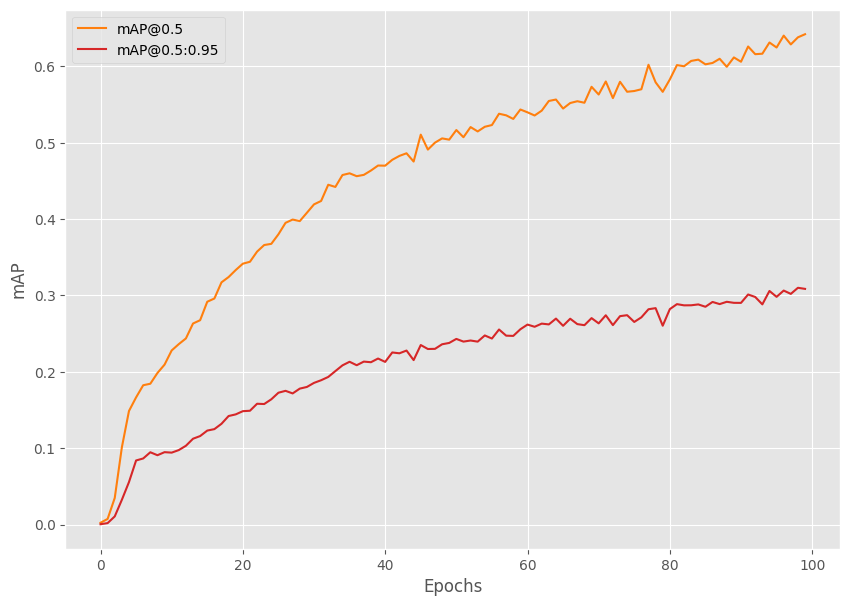

In [9]:
model = create_model(len(CLASSES))    
trainer(model, optimizer="sgd", lr=0.01, NUM_EPOCHS=100)

Checking Labels and images...


100%|██████████| 167/167 [00:00<00:00, 1164.81it/s]


Removed 0 problematic images and annotations.


Evaluating: 100%|██████████| 6/6 [00:03<00:00,  1.75it/s, Model Time=0.103s]




{'classes': tensor([1, 2, 3, 4, 5, 6], dtype=torch.int32),
 'map': tensor(0.2687),
 'map_50': tensor(0.5391),
 'map_75': tensor(0.2405),
 'map_large': tensor(0.3738),
 'map_medium': tensor(0.3528),
 'map_per_class': tensor([0.1364, 0.0566, 0.2480, 0.5196, 0.5944, 0.0573]),
 'map_small': tensor(0.1213),
 'mar_1': tensor(0.2867),
 'mar_10': tensor(0.3451),
 'mar_100': tensor(0.3451),
 'mar_100_per_class': tensor([0.2521, 0.1442, 0.3370, 0.5776, 0.6519, 0.1078]),
 'mar_large': tensor(0.4114),
 'mar_medium': tensor(0.4482),
 'mar_small': tensor(0.2057)}


("Classes: ['__background__', 'Face Mask', 'Glasses', 'Gloves', 'Hemet', "
 "'Safety Vest', 'Shoes']")


mAP / mAR @[IoU 05-095] per class
-------------------------------------------------------------------------
|    | Class                | mAP                  | mAR                  |
-------------------------------------------------------------------------
|1   | Face Mask            | 0.136               | 0.252               |
|2 

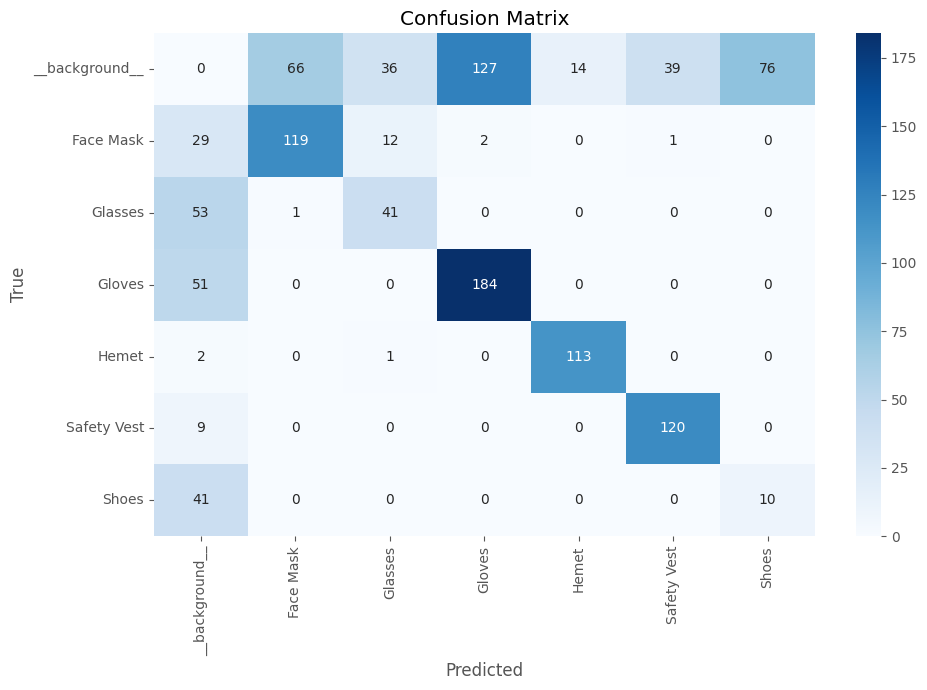


Classification Report WithOut Background:
                precision    recall  f1-score   support

__background__       0.00      0.00      0.00       358
     Face Mask       0.64      0.73      0.68       163
       Glasses       0.46      0.43      0.44        95
        Gloves       0.59      0.78      0.67       235
         Hemet       0.89      0.97      0.93       116
   Safety Vest       0.75      0.93      0.83       129
         Shoes       0.12      0.20      0.15        51

      accuracy                           0.51      1147
     macro avg       0.49      0.58      0.53      1147
  weighted avg       0.43      0.51      0.47      1147



In [10]:
shutil.make_archive('results', 'zip', od)
evaluation(model, TEST_DIR)

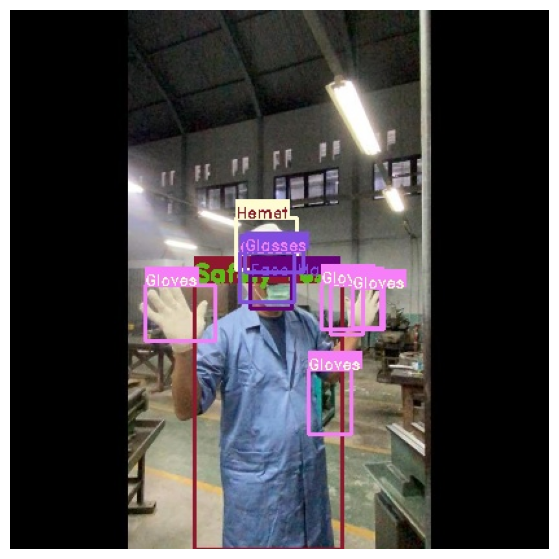

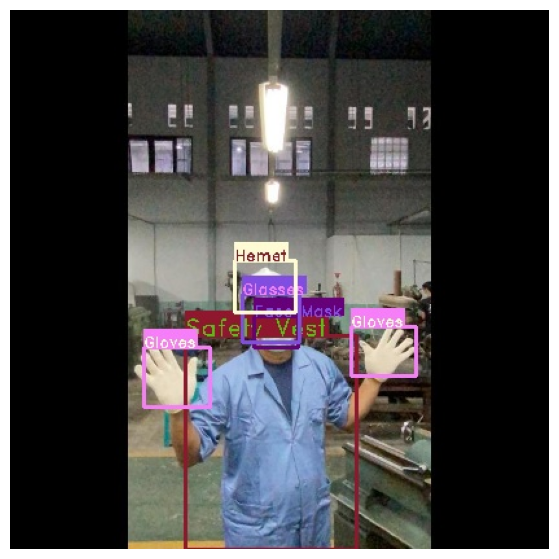

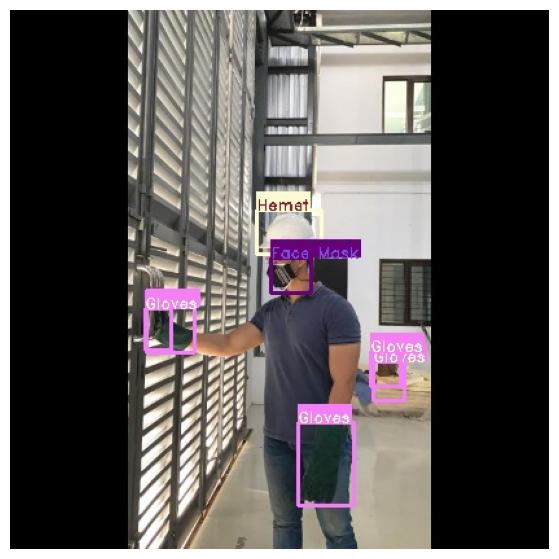

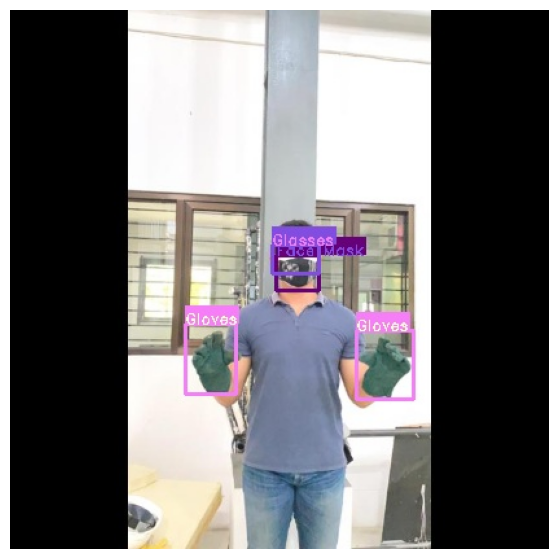

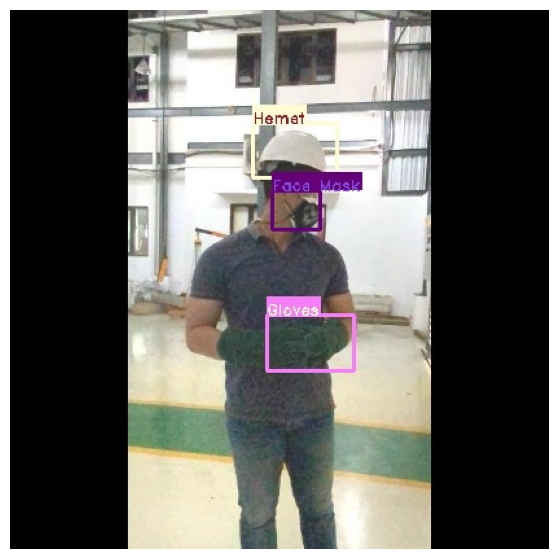

...

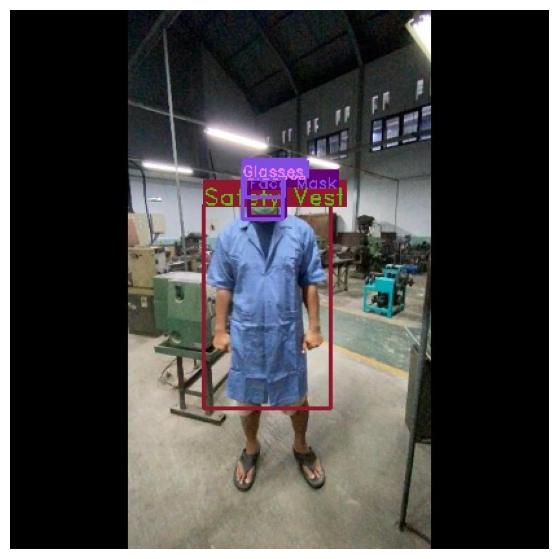

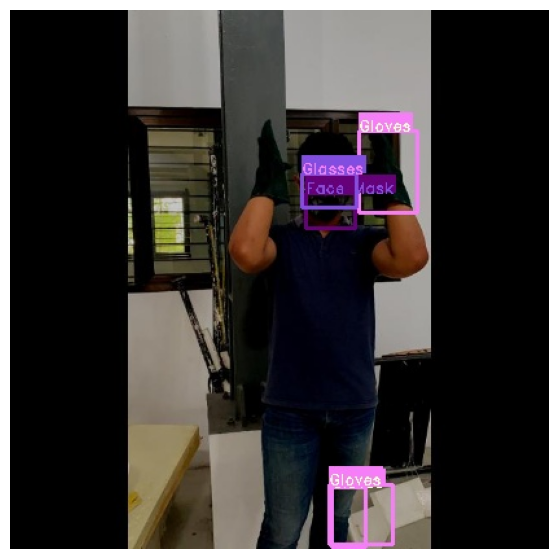

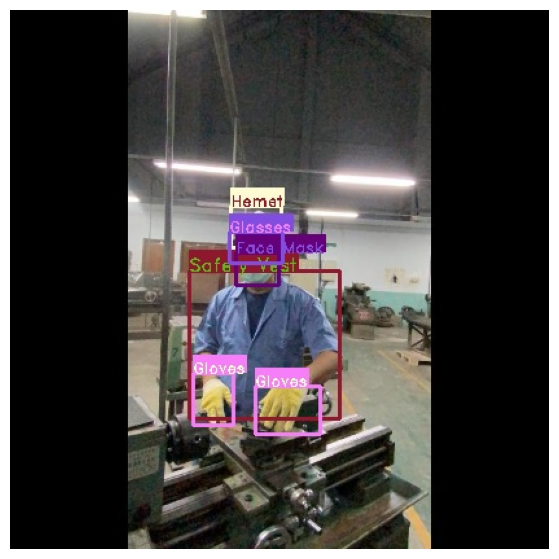

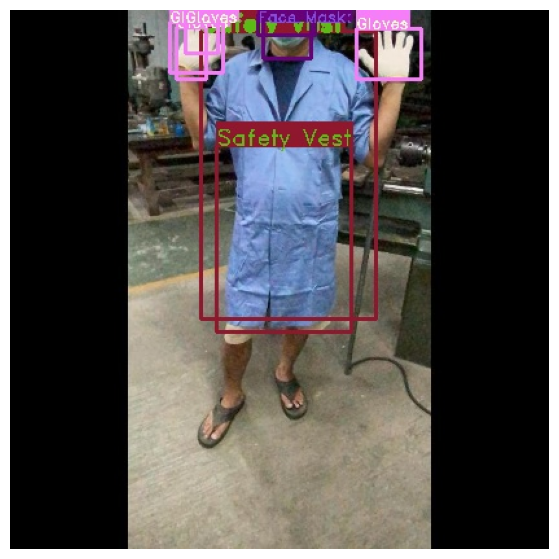

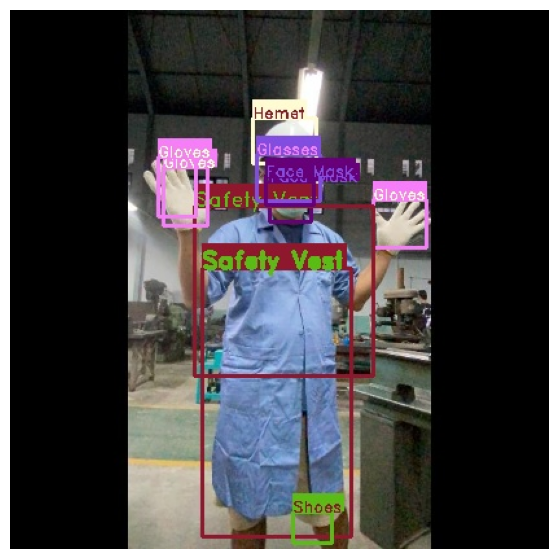

In [11]:
valid_images = glob.glob(f"{od}/*.jpg")

for i in range(len(valid_images)):
    plt.figure(figsize=(10, 7))
    image = plt.imread(valid_images[i])
    plt.imshow(image)
    plt.axis('off')
    plt.show()